#  DO's and DON'Ts of Data Visualization

In this chapter we are going to see why some types of visualizations are not a good idea.

## Set Up

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np

# this is to silence pandas' warnings
import warnings
warnings.simplefilter(action='ignore')
    
%matplotlib inline
%config InlineBackend.figure_format='svg'

#constant variables needed for the configuration of plots' appearance
FONT_SCALE = 1.3
FONT_FAMILY = 'DejaVu Sans'

In [2]:
# selecting a color map for the visualizations
colors = plt.cm.Paired.colors

## Pie Charts

Let's compare the visualizations below.

In [3]:
data_1 = np.array([17, 18, 20, 22, 24])
data_2 = np.array([20, 18, 21, 23, 23])
data_3 = np.array([28, 26, 23, 21, 21])

data = np.array([data_1, data_2, data_3])
labels = np.array(['a', 'b', 'c', 'd', 'e'])

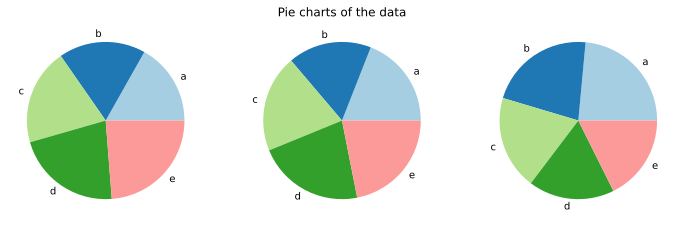

In [4]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))

for i, ax in enumerate(axes):
    ax.pie(x=data[i], labels=labels, colors=colors)

axes[1].set_title('Pie charts of the data')
plt.show()

From the above figure can you tell the difference between the three datasets? Now let's see the corresponding barplot representation.

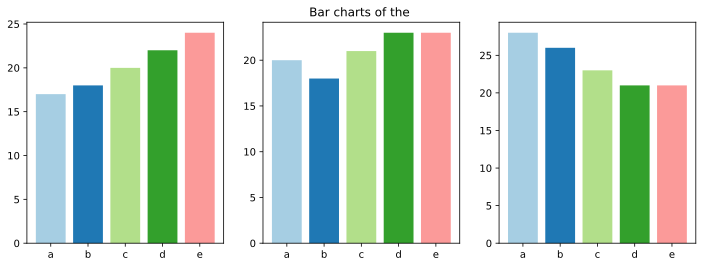

In [5]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
for i, ax in enumerate(axes):
    ax.bar(labels, data[i], color=colors)

axes[1].set_title('Bar charts of the ')
plt.show()

Now you can clearly see that the datasets are not as similar as the pie charts show them to be.

## Sorting data

Look at the data below and choose which chart do you looks better.

In [6]:
labels = np.array(['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o'])
data = np.random.randint(low=5, high=25, size=15)
data = pd.DataFrame({'Labels': labels, 'Values': data})

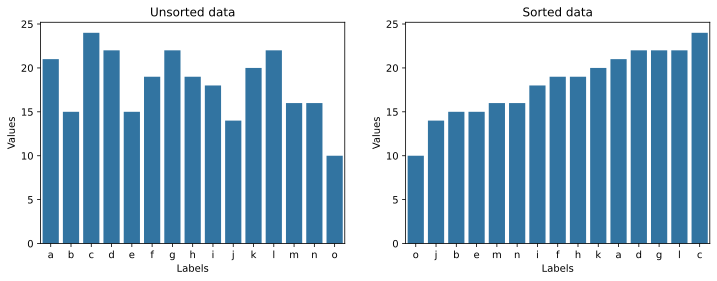

In [7]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# unsorted
sns.barplot(data = data, x='Labels', y='Values', 
            ax=axes[0], color=colors[1])
# sorted
sns.barplot(data = data, x='Labels', y='Values', 
            order=data.sort_values('Values').Labels, 
            ax=axes[1], color=colors[1])

axes[0].set_title('Unsorted data')
axes[1].set_title('Sorted data')

plt.show()

## Overplotting

Overplotting is something that should be avoided because it does not necessarily transmit more information. Take a look at the chart below. Can you understand where the data has come from?

In [8]:
#generating data
data_1 = pd.DataFrame({'x':np.random.normal(loc=10, scale=1.2, size=7500),
                        'y': np.random.normal(loc=10, scale=1.2, size=7500)})
data_2 = pd.DataFrame({'x':np.random.normal(loc=14.5, scale=1.2, size=7500),
                        'y': np.random.normal(loc=14.5, scale=1.2, size=7500)})
data_3 = pd.DataFrame({'x':np.random.normal(loc=9, scale=1.5, size=7500),
                        'y': np.random.normal(loc=15.5, scale=1.5, size=7500)})

data = {'data_1': data_1, 'data_2': data_2, 'data_3':data_3}


In [9]:
#plotting data
fig, axes = plt.subplots(figsize=(6, 6))

for set in data.values():
    axes.scatter(x=set['x'], y=set['y'], color=colors[1])

axes.set_xlabel('x')
axes.set_ylabel('y')
axes.set_title('Plotting points')

plt.show()

**Some ways to tackle this:**
 - decrease point size
 - increase transparency
 - different colors for different groups 
 - subsampling

In [10]:
fig, axes = plt.subplots(nrows=2, ncols = 2, figsize=(12, 12))
colors = colors[:3] # select the first 3 colors of the color palette

for row in range(0,2):
    for col in range(0,2):
        if row==0 and col==0:
            for i, set in enumerate(data.values()):
                axes[row, col].scatter(x=set['x'], y=set['y'], color=colors[i])
            axes[row,col].set_title('Different colors for different groups')
        elif row==0 and col==1:
            for set in data.values():
                axes[row,col].scatter(x=set['x'], y=set['y'], s=0.8, color=colors[1])
            axes[row,col].set_title('Changing size')
        elif row==1 and col==0:
            for set in data.values():
                axes[row,col].scatter(x=set['x'], y=set['y'], alpha=0.01, color=colors[1])
            axes[row,col].set_title('Changing transparency')
        elif row==1 and col==1:
            # subsample data
            subsample_1 = data_1.sample(1000, random_state=0)
            subsample_2 = data_2.sample(1000, random_state=0)
            subsample_3 = data_3.sample(1000, random_state=0)
            subsample = {'sub_1': subsample_1, 'sub_2':subsample_2, 'sub_3': subsample_3}
            # plot data
            for set in subsample.values():
                axes[row,col].scatter(x=set['x'], y=set['y'], color=colors[1])
            axes[row,col].set_title('Subsampling')

plt.show()


You can find more information on different strategies to deal  with overplotting [here](https://www.data-to-viz.com/caveat/overplotting.html).

## Avoid 3D plots

3D plots may seem fancy but they are difficult to understand. Instead you can substitute them with a scatterplot if all your columns have numerical data or with a heatmap if all your data has two categorical features and one numerical feature.

In [11]:
# the data
# picking 60 points from a random uniform distribution
# with bounds between 10 and 20

np.random.seed(0) # to have reproducible results

# numerical data
a = np.random.uniform(10, 20, 60)
b = np.random.uniform(10, 20, 60)
c = np.random.uniform(10, 20, 60)

# categorical data - categories are 1,2,3 for x and y 
x = np.array([1, 1, 1, 2, 2, 2, 3, 3, 3])
y = np.array([1, 2, 3, 1, 2, 3, 1, 2, 3])
z = np.random.uniform(10, 20, 9)


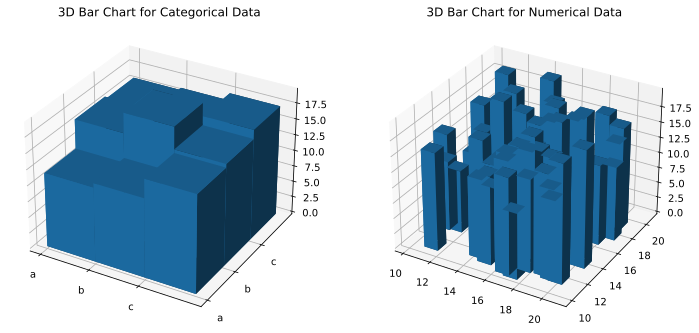

In [12]:
# 3D plot
fig = plt.figure(figsize=(12,6))
ax1 = fig.add_subplot(121, projection='3d')
ax2 = fig.add_subplot(122, projection='3d')

bottom = np.zeros_like(z)
width=depth=1
ax1.set_xticks(np.unique(x))
ax1.set_yticks(np.unique(y))
ax1.set_xticklabels(['a', 'b', 'c'])
ax1.set_yticklabels(['a', 'b', 'c'])
ax1.set_title('3D Bar Chart for Categorical Data')
ax1.bar3d(x, y, bottom, width, depth, z);

bottom = np.zeros_like(c)
ax2.set_title('3D Bar Chart for Numerical Data')
ax2.bar3d(a, b, bottom, width, depth, c);


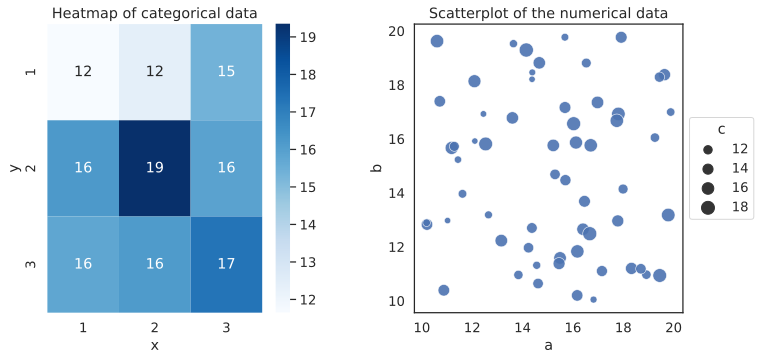

In [13]:
data_frame = pd.DataFrame({'x':x, 'y':y, 'z':z}).pivot('y', 'x', 'z')

sns.set(rc={'figure.figsize':(11, 6), 'font.family': [FONT_FAMILY]}, style='white')
with sns.plotting_context("notebook", font_scale=1.2):
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2)
    plt.tight_layout(pad = 4)
    # seaborn's heatmap
    sns.heatmap(
        data=data_frame,
        cmap='Blues',
        annot=True,
        ax = ax1
    )

    ax2 = sns.scatterplot(
        x=a, 
        y=b, 
        size=c,
        sizes=(40, 200),
        alpha=0.9
    )
    
    # matplotlib's customization
    ax2.set_xlabel('a')
    ax2.set_ylabel('b')
    ax2.set_title('Scatterplot of the numerical data')

    ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    legend = ax2.get_legend()
    legend.set_title('c')


    ax1.set_title('Heatmap of categorical data')